# Predicting type of crimes in LA on given Time and location

### Dataset Description

We will be using this data set:

https://data.lacity.org/Public-Safety/Crime-Data-from-2020-to-Present/2nrs-mtv8

#### Columns
    
* DR_NO: Division of Records Number, which is an official file number.
* Date Rptd: Date when the crime was reported, in the format MM/DD/YYYY.
* DATE OCC: Date when the crime occurred, in the format MM/DD/YYYY.
* TIME OCC: Time when the crime occurred, in 24-hour military time format.
* AREA: A code representing the community police station responsible for the area where the crime occurred.
* AREA NAME: Name of the geographic area or patrol division that is responsible for the area where the crime occurred.
* Rpt Dist No: A four-digit code that represents a sub-area within a geographic area.
* Part 1-2: A number indicating the type of crime committed.
* Crm Cd: A code indicating the crime committed.
* Crm Cd Desc: A description of the crime code provided.
* Mocodes: Modus Operandi, which are activities associated with the suspect in commission of the crime.
* Vict Age: The age of the victim, represented as a two-digit number.
* Vict Sex: The sex of the victim, represented as F (female), M (male), or X (unknown).
* Vict Descent: Descent code of the victim, indicating the racial or ethnic group they belong to.
* Premis Cd: A code indicating the type of structure, vehicle, or location where the crime took place.
* Premis Desc: A description of the premise code provided.
* Weapon Used Cd: A code indicating the type of weapon used in the crime.
* Weapon Desc: A description of the weapon used code provided.
* Status: A code indicating the status of the case.
* Status Desc: A description of the status code provided.
* Crm Cd 1: A code indicating the primary and most serious crime committed.
* Crm Cd 2-4: Additional codes indicating less serious offenses.
* LOCATION: Street address of crime incident rounded to the nearest hundred block to maintain anonymity.
* Cross Street: Cross street of the rounded address.
* LAT: Latitude of the location where the crime occurred.
* LON: Longitude of the location where the crime occurred.

In [ ]:
import pandas as pd
import io
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,f1_score,classification_report,confusion_matrix
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/MyDrive/Crime_Data_from_2020_to_Present.csv'
df = pd.read_csv(file_path)

In [ ]:
# #Load data
# from google.colab import files
# uploaded = files.upload()
# df = pd.read_csv(io.BytesIO(uploaded['Crime_Data_from_2020_to_Present.csv']))
# #print(df)
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


### Data Preprocessing

In [ ]:
#checking for data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 739687 entries, 0 to 739686
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           739687 non-null  int64  
 1   Date Rptd       739687 non-null  object 
 2   DATE OCC        739687 non-null  object 
 3   TIME OCC        739687 non-null  int64  
 4   AREA            739687 non-null  int64  
 5   AREA NAME       739687 non-null  object 
 6   Rpt Dist No     739687 non-null  int64  
 7   Part 1-2        739687 non-null  int64  
 8   Crm Cd          739687 non-null  int64  
 9   Crm Cd Desc     739687 non-null  object 
 10  Mocodes         638226 non-null  object 
 11  Vict Age        739687 non-null  int64  
 12  Vict Sex        643115 non-null  object 
 13  Vict Descent    643109 non-null  object 
 14  Premis Cd       739677 non-null  float64
 15  Premis Desc     739266 non-null  object 
 16  Weapon Used Cd  256726 non-null  float64
 17  Weapon Des

In [ ]:
# Removing irrelevant/not meaningful attributes from description of columns data. there are some columns don't needed so we drop them
col = ['Date Rptd','DR_NO','AREA', 'Mocodes', 'Premis Desc', 'Weapon Desc', 'Status Desc','Crm Cd 1',
       'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'Cross Street','Weapon Used Cd']
df = df.drop(col,axis=1)

In [ ]:
# Handling null values
df.isna().sum()/df.shape[0]
# filling victim sex empty rows with "X" unknown symbol
df["Vict Sex"].fillna("X",inplace=True)

# filling victim descent empty rows with "X" unknown symbol
df["Vict Descent"].fillna("X",inplace=True)

#dropping any empty rows existing after this
df.dropna(inplace=True)

In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,LOCATION,LAT,LON
0,01/08/2020 12:00:00 AM,2230,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,36,F,B,501.0,AO,1100 W 39TH PL,34.0141,-118.2978
1,01/01/2020 12:00:00 AM,330,Central,163,2,624,BATTERY - SIMPLE ASSAULT,25,M,H,102.0,IC,700 S HILL ST,34.0459,-118.2545
2,02/13/2020 12:00:00 AM,1200,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,0,X,X,726.0,AA,200 E 6TH ST,34.0448,-118.2474
3,01/01/2020 12:00:00 AM,1730,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,F,W,502.0,IC,5400 CORTEEN PL,34.1685,-118.4019
4,01/01/2020 12:00:00 AM,415,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,X,X,409.0,IC,14400 TITUS ST,34.2198,-118.4468


In [ ]:
# Converting the date column to datetime
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], format='%m/%d/%Y %I:%M:%S %p')

In [ ]:
# Extracting year, month, day into separate columns
df['year'] = df['DATE OCC'].dt.year
df['month'] = df['DATE OCC'].dt.month
df['day'] = df['DATE OCC'].dt.day
df['day_of_week'] = df['DATE OCC'].dt.day_name()

In [ ]:
# Converting time to string
df['TIME OCC'] = df['TIME OCC'].astype('str')

# converting the column with 4 digits
df['TIME OCC'] = df['TIME OCC'].apply(lambda x: x.zfill(4))

# extracting hour and minute
df['hour'] = df['TIME OCC'].str[:2]
df['minute'] = df['TIME OCC'].str[2:]

In [ ]:
#Checking no of Targets
print(len(df["Crm Cd"].unique()))

138


In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Vict Descent,...,Status,LOCATION,LAT,LON,year,month,day,day_of_week,hour,minute
0,2020-01-08,2230,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,36,F,B,...,AO,1100 W 39TH PL,34.0141,-118.2978,2020,1,8,Wednesday,22,30
1,2020-01-01,0330,Central,163,2,624,BATTERY - SIMPLE ASSAULT,25,M,H,...,IC,700 S HILL ST,34.0459,-118.2545,2020,1,1,Wednesday,03,30
2,2020-02-13,1200,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,0,X,X,...,AA,200 E 6TH ST,34.0448,-118.2474,2020,2,13,Thursday,12,00
3,2020-01-01,1730,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,F,W,...,IC,5400 CORTEEN PL,34.1685,-118.4019,2020,1,1,Wednesday,17,30
4,2020-01-01,0415,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,X,X,...,IC,14400 TITUS ST,34.2198,-118.4468,2020,1,1,Wednesday,04,15


In [ ]:
df.columns

Index(['DATE OCC', 'TIME OCC', 'AREA NAME', 'Rpt Dist No', 'Part 1-2',
       'Crm Cd', 'Crm Cd Desc', 'Vict Age', 'Vict Sex', 'Vict Descent',
       'Premis Cd', 'Status', 'LOCATION', 'LAT', 'LON', 'year', 'month', 'day',
       'day_of_week', 'hour', 'minute'],
      dtype='object')

In [ ]:
df['Crm Cd Desc']

0                                  BATTERY - SIMPLE ASSAULT
1                                  BATTERY - SIMPLE ASSAULT
2                 SEX OFFENDER REGISTRANT OUT OF COMPLIANCE
3                  VANDALISM - MISDEAMEANOR ($399 OR UNDER)
4         VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...
                                ...                        
739682                                   BUNCO, GRAND THEFT
739683    VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...
739684       ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT
739685       ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT
739686             VANDALISM - MISDEAMEANOR ($399 OR UNDER)
Name: Crm Cd Desc, Length: 739677, dtype: object

In [ ]:
df.shape

(739677, 21)

In [ ]:
df['Crm Cd Desc'].unique()

array(['BATTERY - SIMPLE ASSAULT',
       'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE',
       'VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
       'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
       'RAPE, FORCIBLE', 'SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
       'OTHER MISCELLANEOUS CRIME',
       'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
       'BURGLARY FROM VEHICLE', 'CRIMINAL THREATS - NO WEAPON DISPLAYED',
       'ARSON', 'INTIMATE PARTNER - SIMPLE ASSAULT',
       'THEFT PLAIN - PETTY ($950 & UNDER)', 'THEFT OF IDENTITY',
       'ROBBERY', 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
       'BURGLARY', 'VEHICLE - STOLEN',
       'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)',
       'BRANDISH WEAPON', 'INTIMATE PARTNER - AGGRAVATED ASSAULT',
       'BUNCO, GRAND THEFT', 'THEFT, PERSON',
       'BATTERY WITH SEXUAL CONTACT', 'BIKE - STOLEN',
       'BATTERY POLICE (SIMPLE)',
       'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
       'VIOLAT

In [ ]:
# due to the huge number of Labels we should map them to reduce its numbers
def Crime_type(crime):

    types = ["STOLEN",'BATTERY','THEFT', 'BURGLARY', 'VANDALISM', 'ASSAULT', 'CRIMINAL THREATS',
             'TRESPASSING','VIOLATION',"CRIMINAL HOMICIDE", 'CHILD ABUSE', 'RAPE','ROBBERY']

    types_name = ["MOTOR VEHICLE THEFT",'BATTERY','THEFT', 'BURGLARY', 'VANDALISM', 'ASSAULT', 'CRIMINAL THREATS',
              'TRESPASSING','VIOLATION',"CRIMINAL HOMICIDE", 'CHILD ABUSE', 'RAPE','ROBBERY' ]

    for name,t in zip(types_name,types) :
        if t in crime:
            return name

    return "OTHERS"

In [ ]:
# apply function on each row
df["Crime"] = df["Crm Cd Desc"].apply(Crime_type)

In [ ]:
df["Crime"].value_counts()

THEFT                  199071
ASSAULT                 97413
BURGLARY                94335
MOTOR VEHICLE THEFT     91767
VANDALISM               65798
BATTERY                 64073
OTHERS                  52670
ROBBERY                 29164
CRIMINAL THREATS        15410
VIOLATION               15241
TRESPASSING             10299
RAPE                     3177
CRIMINAL HOMICIDE        1259
Name: Crime, dtype: int64

In [ ]:
#drop "Crm Cd Desc" and "Crm Cd"
df = df.drop(['Crm Cd','Crm Cd Desc'],axis = 1)
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,LOCATION,LAT,LON,year,month,day,day_of_week,hour,minute,Crime
0,2020-01-08,2230,Southwest,377,2,36,F,B,501.0,AO,1100 W 39TH PL,34.0141,-118.2978,2020,1,8,Wednesday,22,30,BATTERY
1,2020-01-01,0330,Central,163,2,25,M,H,102.0,IC,700 S HILL ST,34.0459,-118.2545,2020,1,1,Wednesday,03,30,BATTERY
2,2020-02-13,1200,Central,155,2,0,X,X,726.0,AA,200 E 6TH ST,34.0448,-118.2474,2020,2,13,Thursday,12,00,OTHERS
3,2020-01-01,1730,N Hollywood,1543,2,76,F,W,502.0,IC,5400 CORTEEN PL,34.1685,-118.4019,2020,1,1,Wednesday,17,30,VANDALISM
4,2020-01-01,0415,Mission,1998,2,31,X,X,409.0,IC,14400 TITUS ST,34.2198,-118.4468,2020,1,1,Wednesday,04,15,VANDALISM


In [ ]:
df.Crime.value_counts()

THEFT                  199071
ASSAULT                 97413
BURGLARY                94335
MOTOR VEHICLE THEFT     91767
VANDALISM               65798
BATTERY                 64073
OTHERS                  52670
ROBBERY                 29164
CRIMINAL THREATS        15410
VIOLATION               15241
TRESPASSING             10299
RAPE                     3177
CRIMINAL HOMICIDE        1259
Name: Crime, dtype: int64

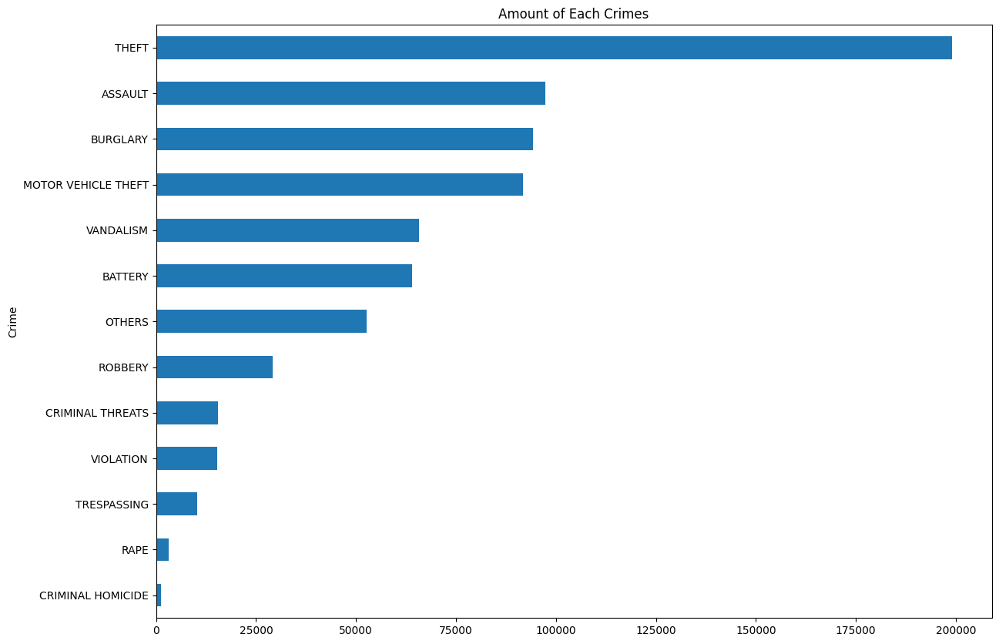

In [ ]:
# Plot Bar Chart visualization for Crime Types
plt.figure(figsize=(14,10))
plt.title('Amount of Each Crimes')
plt.ylabel('Crime Type')
plt.xlabel('Amount of Crimes')

df.groupby([df['Crime']]).size().sort_values(ascending=True).plot(kind='barh')

plt.show()

In [ ]:
df['Crime'].value_counts()

THEFT                  199071
ASSAULT                 97413
BURGLARY                94335
MOTOR VEHICLE THEFT     91767
VANDALISM               65798
BATTERY                 64073
OTHERS                  52670
ROBBERY                 29164
CRIMINAL THREATS        15410
VIOLATION               15241
TRESPASSING             10299
RAPE                     3177
CRIMINAL HOMICIDE        1259
Name: Crime, dtype: int64

In [ ]:
crime_types_to_update = ['OTHERS','CRIMINAL THREATS', 'VIOLATION', 'TRESPASSING', 'RAPE', 'CRIMINAL HOMICIDE']

# Updating specified crime types to 'OTHERS' based on the total count
df.loc[df['Crime'].isin(crime_types_to_update), 'Crime'] = 'OTHERS'

In [ ]:
df['Crime'].value_counts()

THEFT                  199071
OTHERS                  98056
ASSAULT                 97413
BURGLARY                94335
MOTOR VEHICLE THEFT     91767
VANDALISM               65798
BATTERY                 64073
ROBBERY                 29164
Name: Crime, dtype: int64

In [ ]:
# Dropping all the rows with type 'OTHERS'
df = df[df['Crime']!='OTHERS']

In [ ]:
# Converting the following into binary clasification by dividing the crime type into violent and non violent

def categorize_crime(crime_type):
    if crime_type in ['ASSAULT','BATTERY', 'ROBBERY', 'RAPE', 'CRIMINAL HOMICIDE']:
        return 'violent'
    else:
        return 'non-violent'

df['Crime_Type'] = df['Crime'].apply(categorize_crime)

print(df['Crime_Type'].value_counts())

non-violent    450971
violent        190650
Name: Crime_Type, dtype: int64


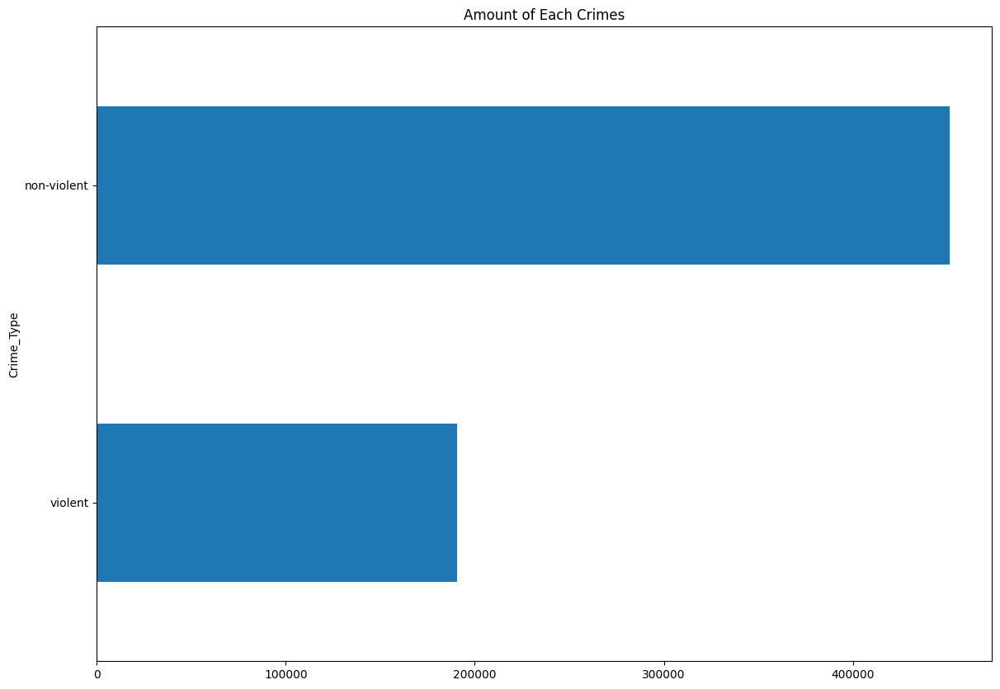

In [ ]:
# Plot Bar Chart visualize for Crime Types
plt.figure(figsize=(14,10))
plt.title('Amount of Each Crimes')
plt.ylabel('Crime Type')
plt.xlabel('Amount of Crimes')

df.groupby([df['Crime_Type']]).size().sort_values(ascending=True).plot(kind='barh')

plt.show()

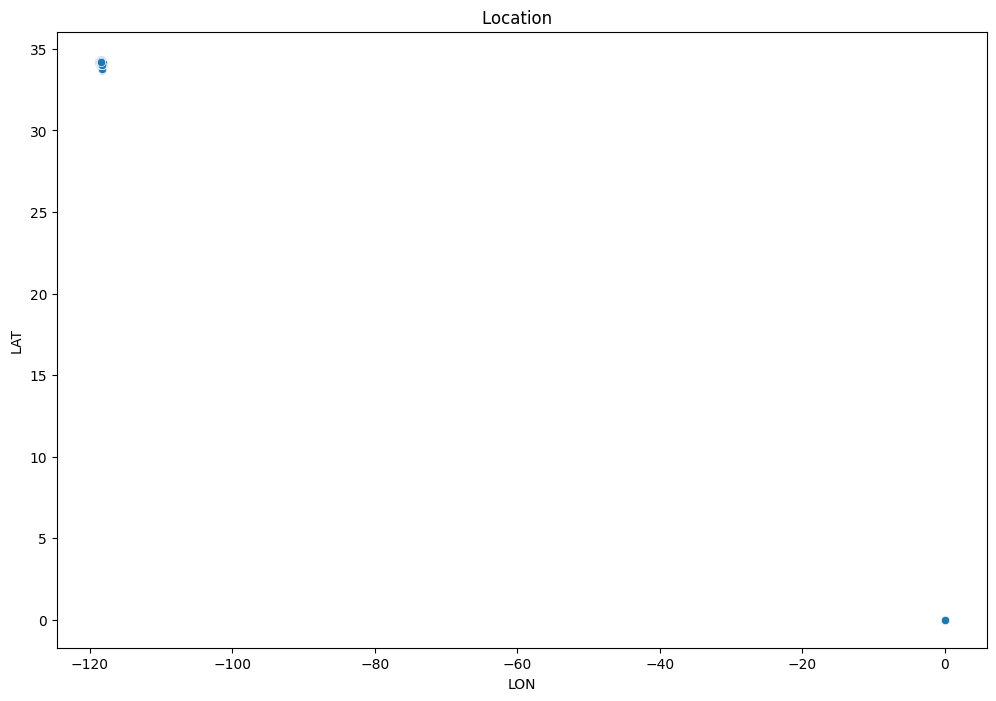

In [ ]:
# Checking Location of Crimes

plt.figure(figsize=(12,8))
plt.title("Location  ");
sns.scatterplot(x="LON",y="LAT",data=df);

In [ ]:
# There are some lat and lon with value of 0 which need to be neglected
#dropping rows where Lat or Lon is 0
df = df.drop(index = df[( df["LAT"] == 0 ) | ( df["LON"] == 0) ].index)

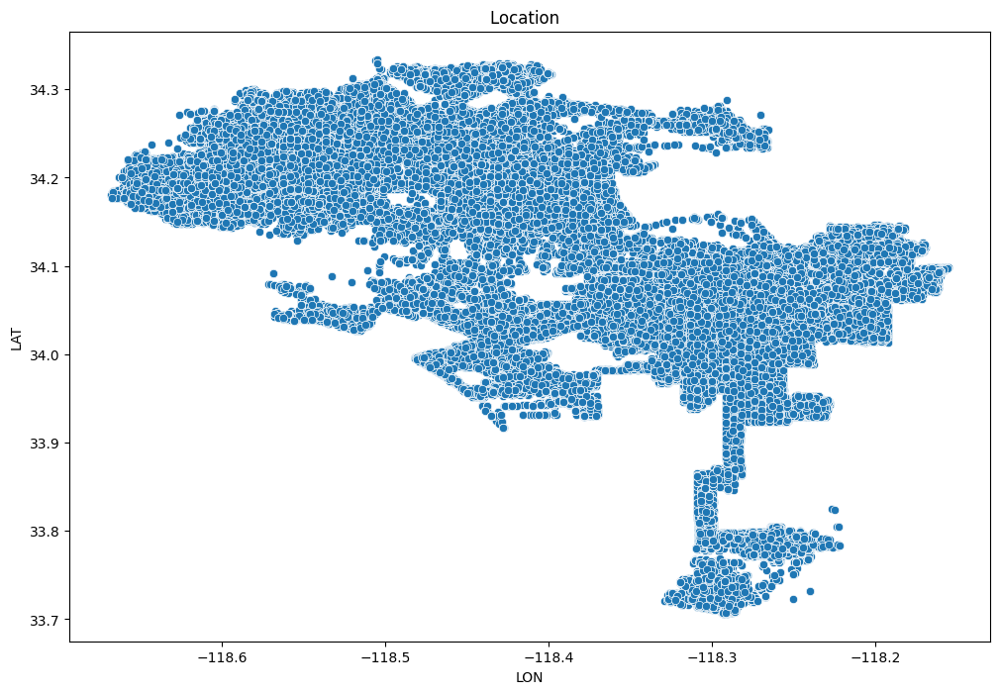

In [ ]:
plt.figure(figsize=(12,8))
plt.title("Location  ");
sns.scatterplot(x="LON",y="LAT",data=df);

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 640254 entries, 0 to 739686
Data columns (total 21 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   DATE OCC      640254 non-null  datetime64[ns]
 1   TIME OCC      640254 non-null  object        
 2   AREA NAME     640254 non-null  object        
 3   Rpt Dist No   640254 non-null  int64         
 4   Part 1-2      640254 non-null  int64         
 5   Vict Age      640254 non-null  int64         
 6   Vict Sex      640254 non-null  object        
 7   Vict Descent  640254 non-null  object        
 8   Premis Cd     640254 non-null  float64       
 9   Status        640254 non-null  object        
 10  LOCATION      640254 non-null  object        
 11  LAT           640254 non-null  float64       
 12  LON           640254 non-null  float64       
 13  year          640254 non-null  int64         
 14  month         640254 non-null  int64         
 15  day           640

In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,...,LAT,LON,year,month,day,day_of_week,hour,minute,Crime,Crime_Type
0,2020-01-08,2230,Southwest,377,2,36,F,B,501.0,AO,...,34.0141,-118.2978,2020,1,8,Wednesday,22,30,BATTERY,violent
1,2020-01-01,0330,Central,163,2,25,M,H,102.0,IC,...,34.0459,-118.2545,2020,1,1,Wednesday,03,30,BATTERY,violent
3,2020-01-01,1730,N Hollywood,1543,2,76,F,W,502.0,IC,...,34.1685,-118.4019,2020,1,1,Wednesday,17,30,VANDALISM,non-violent
4,2020-01-01,0415,Mission,1998,2,31,X,X,409.0,IC,...,34.2198,-118.4468,2020,1,1,Wednesday,04,15,VANDALISM,non-violent
6,2020-01-02,1315,Central,161,1,23,M,H,404.0,IC,...,34.0483,-118.2631,2020,1,2,Thursday,13,15,THEFT,non-violent


In [ ]:
import folium
from folium.plugins import HeatMap
# create map centered at LA
la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

# create heatmap layer with reduced intensity
heat_data = [[row['LAT'], row['LON']] for index, row in df.iterrows()]
HeatMap(heat_data, min_opacity=0.2, max_val=10).add_to(la_map)

# display map
la_map

In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,...,LAT,LON,year,month,day,day_of_week,hour,minute,Crime,Crime_Type
0,2020-01-08,2230,Southwest,377,2,36,F,B,501.0,AO,...,34.0141,-118.2978,2020,1,8,Wednesday,22,30,BATTERY,violent
1,2020-01-01,0330,Central,163,2,25,M,H,102.0,IC,...,34.0459,-118.2545,2020,1,1,Wednesday,03,30,BATTERY,violent
3,2020-01-01,1730,N Hollywood,1543,2,76,F,W,502.0,IC,...,34.1685,-118.4019,2020,1,1,Wednesday,17,30,VANDALISM,non-violent
4,2020-01-01,0415,Mission,1998,2,31,X,X,409.0,IC,...,34.2198,-118.4468,2020,1,1,Wednesday,04,15,VANDALISM,non-violent
6,2020-01-02,1315,Central,161,1,23,M,H,404.0,IC,...,34.0483,-118.2631,2020,1,2,Thursday,13,15,THEFT,non-violent


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 640254 entries, 0 to 739686
Data columns (total 21 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   DATE OCC      640254 non-null  datetime64[ns]
 1   TIME OCC      640254 non-null  object        
 2   AREA NAME     640254 non-null  object        
 3   Rpt Dist No   640254 non-null  int64         
 4   Part 1-2      640254 non-null  int64         
 5   Vict Age      640254 non-null  int64         
 6   Vict Sex      640254 non-null  object        
 7   Vict Descent  640254 non-null  object        
 8   Premis Cd     640254 non-null  float64       
 9   Status        640254 non-null  object        
 10  LOCATION      640254 non-null  object        
 11  LAT           640254 non-null  float64       
 12  LON           640254 non-null  float64       
 13  year          640254 non-null  int64         
 14  month         640254 non-null  int64         
 15  day           640

In [ ]:
df['AREA NAME'] = df['AREA NAME'].astype('category')
df['Rpt Dist No'] = df['Rpt Dist No'].astype('category')
df['Premis Cd'] = df['Premis Cd'].astype('int')
df['Premis Cd'] = df['Premis Cd'].astype('category')
df['hour'] = df['hour'].astype('category')
df['minute'] = df['minute'].astype('category')
df['day'] = df['day'].astype('category')
df['month'] = df['month'].astype('category')
df['Status'] = df['Status'].astype('category')
df['Part 1-2'] = df['Part 1-2'].astype('category')
df['day_of_week'] = df['day_of_week'].astype('category')

In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,...,LAT,LON,year,month,day,day_of_week,hour,minute,Crime,Crime_Type
0,2020-01-08,2230,Southwest,377,2,36,F,B,501,AO,...,34.0141,-118.2978,2020,1,8,Wednesday,22,30,BATTERY,violent
1,2020-01-01,0330,Central,163,2,25,M,H,102,IC,...,34.0459,-118.2545,2020,1,1,Wednesday,03,30,BATTERY,violent
3,2020-01-01,1730,N Hollywood,1543,2,76,F,W,502,IC,...,34.1685,-118.4019,2020,1,1,Wednesday,17,30,VANDALISM,non-violent
4,2020-01-01,0415,Mission,1998,2,31,X,X,409,IC,...,34.2198,-118.4468,2020,1,1,Wednesday,04,15,VANDALISM,non-violent
6,2020-01-02,1315,Central,161,1,23,M,H,404,IC,...,34.0483,-118.2631,2020,1,2,Thursday,13,15,THEFT,non-violent


In [ ]:
df['LOCATION']

0          1100 W  39TH                         PL
1           700 S  HILL                         ST
3          5400    CORTEEN                      PL
4         14400    TITUS                        ST
6           700 S  FIGUEROA                     ST
                            ...                   
739682     5300    DENNY                        AV
739683    12500    BRANFORD                     ST
739684    12800    FILMORE                      ST
739685     6100 S  VERMONT                      AV
739686    14500    HARTLAND                     ST
Name: LOCATION, Length: 640254, dtype: object

In [ ]:
df.columns

Index(['DATE OCC', 'TIME OCC', 'AREA NAME', 'Rpt Dist No', 'Part 1-2',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Status',
       'LOCATION', 'LAT', 'LON', 'year', 'month', 'day', 'day_of_week', 'hour',
       'minute', 'Crime', 'Crime_Type'],
      dtype='object')

In [ ]:
df['LOCATION'][0]

'1100 W  39TH                         PL'

In [ ]:
# Extract block and street name from the 'Address' column while removing extra spaces
df[['Block', 'Street']] = df['LOCATION'].str.extract(r'(\d+)\s+(.+)')
df['Street'] = df['Street'].str.replace(r'\s+', ' ').str.strip()

In [ ]:
df['Block'].unique()

array(['1100', '700', '5400', '14400', '11900', nan, '800', '100',
       '14200', '3200', '14700', '13600', '5700', '600', '18600', '2700',
       '8500', '500', '8400', '14100', '12100', '200', '2600', '300',
       '2100', '400', '8900', '3000', '1800', '1200', '900', '10300',
       '1300', '23400', '13100', '1600', '6000', '19700', '2200', '1400',
       '11400', '1000', '2500', '2000', '6100', '13500', '00', '5200',
       '10500', '6800', '3900', '6500', '7000', '8700', '11700', '6600',
       '3100', '1700', '5300', '14600', '4400', '3400', '2400', '5800',
       '16700', '10200', '3800', '3500', '4900', '9200', '9800', '7800',
       '4300', '3300', '15600', '7200', '7700', '4600', '9000', '19000',
       '1500', '6200', '1900', '16800', '16400', '13300', '7900', '4000',
       '8200', '2800', '26300', '11800', '2900', '3600', '10700', '4100',
       '19200', '24900', '7100', '7500', '12200', '4800', '18500',
       '18900', '9100', '14800', '14500', '17300', '17000', '10900',

In [ ]:
# Dropping all the block with 00
df = df[df['Block'] != '00']

In [ ]:
df.shape

(638809, 23)

In [ ]:
#Dropping all rows with NaN
df = df.dropna()

In [ ]:
#Counting all missing or NaN vaalues
df.isna().sum().sum()

0

In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,...,year,month,day,day_of_week,hour,minute,Crime,Crime_Type,Block,Street
0,2020-01-08,2230,Southwest,377,2,36,F,B,501,AO,...,2020,1,8,Wednesday,22,30,BATTERY,violent,1100,W 39TH PL
1,2020-01-01,0330,Central,163,2,25,M,H,102,IC,...,2020,1,1,Wednesday,03,30,BATTERY,violent,700,S HILL ST
3,2020-01-01,1730,N Hollywood,1543,2,76,F,W,502,IC,...,2020,1,1,Wednesday,17,30,VANDALISM,non-violent,5400,CORTEEN PL
4,2020-01-01,0415,Mission,1998,2,31,X,X,409,IC,...,2020,1,1,Wednesday,04,15,VANDALISM,non-violent,14400,TITUS ST
6,2020-01-02,1315,Central,161,1,23,M,H,404,IC,...,2020,1,2,Thursday,13,15,THEFT,non-violent,700,S FIGUEROA ST


In [ ]:
len(df['Street'].unique())

9663

In [ ]:
df.shape

(534818, 23)

In [ ]:
df.describe()

,Vict Age,LAT,LON,year
count,534818.000000,534818.000000,534818.000000,534818.000000
mean,29.570155,34.077066,-118.359011,2021.332253
std,22.184458,0.111832,0.105565,1.009669
min,-2.000000,33.706400,-118.667600,2020.000000
25%,0.000000,34.017900,-118.435600,2020.000000
50%,31.000000,34.061800,-118.331000,2021.000000
75%,45.000000,34.168300,-118.276700,2022.000000
max,120.000000,34.334300,-118.156000,2023.000000


In [ ]:
# Selecting features for model

In [ ]:
df.columns

Index(['DATE OCC', 'TIME OCC', 'AREA NAME', 'Rpt Dist No', 'Part 1-2',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Status',
       'LOCATION', 'LAT', 'LON', 'year', 'month', 'day', 'day_of_week', 'hour',
       'minute', 'Crime', 'Crime_Type', 'Block', 'Street'],
      dtype='object')

In [ ]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Vict Age,Vict Sex,Vict Descent,Premis Cd,Status,...,year,month,day,day_of_week,hour,minute,Crime,Crime_Type,Block,Street
0,2020-01-08,2230,Southwest,377,2,36,F,B,501,AO,...,2020,1,8,Wednesday,22,30,BATTERY,violent,1100,W 39TH PL
1,2020-01-01,0330,Central,163,2,25,M,H,102,IC,...,2020,1,1,Wednesday,03,30,BATTERY,violent,700,S HILL ST
3,2020-01-01,1730,N Hollywood,1543,2,76,F,W,502,IC,...,2020,1,1,Wednesday,17,30,VANDALISM,non-violent,5400,CORTEEN PL
4,2020-01-01,0415,Mission,1998,2,31,X,X,409,IC,...,2020,1,1,Wednesday,04,15,VANDALISM,non-violent,14400,TITUS ST
6,2020-01-02,1315,Central,161,1,23,M,H,404,IC,...,2020,1,2,Thursday,13,15,THEFT,non-violent,700,S FIGUEROA ST


In [ ]:
features = ['AREA NAME','Rpt Dist No','Premis Cd','Block','Street','LAT','LON','hour','day_of_week','Crime','Crime_Type']

df = df[features]
df.head()

,AREA NAME,Rpt Dist No,Premis Cd,Block,Street,LAT,LON,hour,day_of_week,Crime,Crime_Type
0,Southwest,377,501,1100,W 39TH PL,34.0141,-118.2978,22,Wednesday,BATTERY,violent
1,Central,163,102,700,S HILL ST,34.0459,-118.2545,03,Wednesday,BATTERY,violent
3,N Hollywood,1543,502,5400,CORTEEN PL,34.1685,-118.4019,17,Wednesday,VANDALISM,non-violent
4,Mission,1998,409,14400,TITUS ST,34.2198,-118.4468,04,Wednesday,VANDALISM,non-violent
6,Central,161,404,700,S FIGUEROA ST,34.0483,-118.2631,13,Thursday,THEFT,non-violent


In [ ]:
# Refined data
df.to_csv('crime_data.csv')
#files.download('crime_data.csv')

In [ ]:
# copy of data
df_1 = df.copy()

In [ ]:
# To reduce the traning time we take random sample and them do undersampling to balance the data

In [ ]:
df.shape

(534818, 11)

In [ ]:
# sample size
sample_size = 50000  # Adjust the sample size as desired

# Randomly sample the data
sampled_df = df.sample(n=sample_size, random_state=42)
sampled_df.reset_index(drop=True, inplace=True)

# shape of sampled dataframe
sampled_df.shape

(50000, 11)

In [ ]:
X = sampled_df.drop(columns=['Crime','Crime_Type'])
y = sampled_df['Crime']

In [ ]:
y.value_counts()

THEFT                  16949
BURGLARY                7806
MOTOR VEHICLE THEFT     6815
ASSAULT                 6795
VANDALISM               5296
BATTERY                 4676
ROBBERY                 1663
Name: Crime, dtype: int64

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

# Create an instance of RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

# Resample the data using RandomUnderSampler
X_resampled, y_resampled = rus.fit_resample(X, y)

In [ ]:
y_resampled.value_counts()

ASSAULT                1663
BATTERY                1663
BURGLARY               1663
MOTOR VEHICLE THEFT    1663
ROBBERY                1663
THEFT                  1663
VANDALISM              1663
Name: Crime, dtype: int64

In [ ]:
df = X_resampled.join(y_resampled)
df.head()

,AREA NAME,Rpt Dist No,Premis Cd,Block,Street,LAT,LON,hour,day_of_week,Crime
0,Mission,1994,108,14700,TITUS ST,34.2197,-118.4536,15,Thursday,ASSAULT
1,Southeast,1863,501,400,E 118TH PL,33.9256,-118.2674,00,Wednesday,ASSAULT
2,N Hollywood,1506,502,7400,VINELAND AV,34.2027,-118.3745,09,Thursday,ASSAULT
3,West LA,842,502,11700,WILSHIRE BL,34.0491,-118.4614,23,Friday,ASSAULT
4,Southwest,334,242,3000,CRENSHAW BL,34.0276,-118.3351,20,Thursday,ASSAULT


In [ ]:
df.Crime.value_counts()

ASSAULT                1663
BATTERY                1663
BURGLARY               1663
MOTOR VEHICLE THEFT    1663
ROBBERY                1663
THEFT                  1663
VANDALISM              1663
Name: Crime, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

df['Crime'] = label_encoder.fit_transform(df['Crime'])

In [ ]:
df.Crime.value_counts()

0    1663
1    1663
2    1663
3    1663
4    1663
5    1663
6    1663
Name: Crime, dtype: int64

In [ ]:
# One-hot encoding all columns except for LAT, LON, and Crime
df_encoded = pd.get_dummies(df[['AREA NAME','Rpt Dist No','Block','Street','Premis Cd','hour','day_of_week']],drop_first=True)

In [ ]:
# Concatenate the one-hot encoded columns with the original dataframe
new_df = pd.concat([df[['LAT', 'LON', 'Crime']], df_encoded], axis=1)

In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11641 entries, 0 to 11640
Columns: 4380 entries, LAT to day_of_week_Wednesday
dtypes: float64(2), int64(1), uint8(4377)
memory usage: 48.9 MB


In [ ]:
new_df.head()

,LAT,LON,Crime,AREA NAME_Central,AREA NAME_Devonshire,AREA NAME_Foothill,AREA NAME_Harbor,AREA NAME_Hollenbeck,AREA NAME_Hollywood,AREA NAME_Mission,...,hour_20,hour_21,hour_22,hour_23,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday
0,34.2197,-118.4536,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
1,33.9256,-118.2674,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,34.2027,-118.3745,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,34.0491,-118.4614,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,34.0276,-118.3351,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11641 entries, 0 to 11640
Columns: 4380 entries, LAT to day_of_week_Wednesday
dtypes: float64(2), int64(1), uint8(4377)
memory usage: 48.9 MB


In [ ]:
X = new_df.drop(columns=['Crime'])
y = new_df["Crime"]

In [ ]:
X.head()

,LAT,LON,AREA NAME_Central,AREA NAME_Devonshire,AREA NAME_Foothill,AREA NAME_Harbor,AREA NAME_Hollenbeck,AREA NAME_Hollywood,AREA NAME_Mission,AREA NAME_N Hollywood,...,hour_20,hour_21,hour_22,hour_23,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday
0,34.2197,-118.4536,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
1,33.9256,-118.2674,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,34.2027,-118.3745,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
3,34.0491,-118.4614,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,34.0276,-118.3351,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


In [ ]:
#Split dataset to Training Set & Test Set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [ ]:
#define a function for train ML model
def train_model(clf, X_train, y_train):
    clf.fit(X_train, y_train)

#define a function for predict ML model
def predict_data(clf, features, target):
    y_pred = clf.predict(features)

    acc = accuracy_score(target,y_pred)
    f1 = f1_score(target, y_pred, average='micro')
    con_matrix = confusion_matrix(target,y_pred)
    class_report = classification_report(target,y_pred)
    return f1, acc, con_matrix, class_report

#define a function for create ML model
def model(clf, X_train, y_train, X_test, y_test):
    train_model(clf, X_train, y_train)

    f1, acc, con_matrix, class_report = predict_data(clf, X_test, y_test)
    print("Test Data:")
    print("-" * 20)
    print("F1 Score:{}".format(f1))
    print("Accuracy:{}".format(acc))
    print("Confusion Matrix")
    print(con_matrix)
    print("Classfication Report")
    print(class_report)
    print("-" * 20)

In [ ]:
# Multinomial Classification

In [ ]:
pip install catboost


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 9.9 MB/s eta 0:00:00


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier


# Instantiate the additional classification models
lrc = LogisticRegression(multi_class='multinomial')
dtc = DecisionTreeClassifier()
knn = KNeighborsClassifier(n_neighbors=1)
rfc = RandomForestClassifier(n_estimators=100)
gnb = GaussianNB()
adaboost = AdaBoostClassifier()
mlp = MLPClassifier()
qda = QuadraticDiscriminantAnalysis()
gbm = GradientBoostingClassifier()
xgb = XGBClassifier()
catboost = CatBoostClassifier()
lgbm = LGBMClassifier()

In [ ]:
#print("\nXGBoost Classifier")
#print("-" * 20)
#model(xgb, X_train, y_train, X_test, y_test)

#print("\nCatBoost Classifier")
#print("-" * 20)
#model(catboost, X_train, y_train, X_test, y_test)

#print("\nLightGBM Classifier")
#print("-" * 20)
#model(lgbm, X_train, y_train, X_test, y_test)


In [ ]:
# print("Logistic Regression")
# print("-" * 20)
# model(lrc, X_train, y_train, X_test, y_test)

# print("\nDecision Tree")
# print("-" * 20)
# model(dtc, X_train, y_train, X_test, y_test)

# print("\nRandom Forest Classifier")
# print("-" * 20)
# model(rfc, X_train, y_train, X_test, y_test)

# print("\nXGBoost Classifier")
# print("-" * 20)
# model(xgb, X_train, y_train, X_test, y_test)

# print("\nCatBoost Classifier")
# print("-" * 20)
# model(catboost, X_train, y_train, X_test, y_test)

# print("\nLightGBM Classifier")
# print("-" * 20)
# model(lgbm, X_train, y_train, X_test, y_test)

# print("\nGradient Boosting Classifier")
# print("-" * 20)
# model(gbm, X_train, y_train, X_test, y_test)

# print("\nAdaBoost Classifier")
# print("-" * 20)
# model(adaboost, X_train, y_train, X_test, y_test)

# print("\nK Nearest Neighbors (KNN)")
# print("-" * 20)
# model(knn, X_train, y_train, X_test, y_test)

# print("\nGaussian Naive Bayes")
# print("-" * 20)
# model(gnb, X_train, y_train, X_test, y_test)

# print("\nMultilayer Perceptron (MLP) Classifier")
# print("-" * 20)
# model(mlp, X_train, y_train, X_test, y_test)

# print("\nQuadratic Discriminant Analysis (QDA)")
# print("-" * 20)
# model(qda, X_train, y_train, X_test, y_test)

Logistic Regression
--------------------
Test Data:
--------------------
F1 Score:0.3374838986689566
Accuracy:0.3374838986689566
Confusion Matrix
[[128  71  23  50  28  37  12]
 [ 72  68  30  42  46  44  20]
 [ 31  24  89 102  20  45  24]
 [  4  17  32 214  30  32   4]
 [ 25  42  20  71 118  37  13]
 [ 57  31  33  97  45  72  22]
 [ 36  39  33  61  14  27  97]]
Classfication Report
              precision    recall  f1-score   support

           0       0.36      0.37      0.36       349
           1       0.23      0.21      0.22       322
           2       0.34      0.27      0.30       335
           3       0.34      0.64      0.44       333
           4       0.39      0.36      0.38       326
           5       0.24      0.20      0.22       357
           6       0.51      0.32      0.39       307

    accuracy                           0.34      2329
   macro avg       0.35      0.34      0.33      2329
weighted avg       0.34      0.34      0.33      2329

------------------

In [ ]:
# --------------------------------------------------------

In [ ]:
# Binomial Classification

In [ ]:
df_1.head()

,AREA NAME,Rpt Dist No,Premis Cd,Block,Street,LAT,LON,hour,day_of_week,Crime,Crime_Type
0,Southwest,377,501,1100,W 39TH PL,34.0141,-118.2978,22,Wednesday,BATTERY,violent
1,Central,163,102,700,S HILL ST,34.0459,-118.2545,03,Wednesday,BATTERY,violent
3,N Hollywood,1543,502,5400,CORTEEN PL,34.1685,-118.4019,17,Wednesday,VANDALISM,non-violent
4,Mission,1998,409,14400,TITUS ST,34.2198,-118.4468,04,Wednesday,VANDALISM,non-violent
6,Central,161,404,700,S FIGUEROA ST,34.0483,-118.2631,13,Thursday,THEFT,non-violent


In [ ]:
df_1.shape

(534818, 11)

In [ ]:
# sample size
sample_size = 50000  # Adjust the sample size as desired

# Randomly sample the data
sampled_df = df_1.sample(n=sample_size, random_state=42)
sampled_df.reset_index(drop=True, inplace=True)

# shape of sampled dataframe
sampled_df.shape

(50000, 11)

In [ ]:
X = df_1.drop(columns=['Crime_Type','Crime'])
y = df_1["Crime_Type"]

In [ ]:
df = X.join(y)

In [ ]:
y.value_counts()

non-violent    393673
violent        141145
Name: Crime_Type, dtype: int64

In [ ]:
# Resampling
from imblearn.under_sampling import RandomUnderSampler

# Creating an instance of RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

# Resampling the data using RandomUnderSampler
X_resampled, y_resampled = rus.fit_resample(X, y)

df = X_resampled.join(y_resampled)
df.head()

,AREA NAME,Rpt Dist No,Premis Cd,Block,Street,LAT,LON,hour,day_of_week,Crime_Type
0,Foothill,1653,501,9700,PINE ORCHARD ST,34.2461,-118.4105,06,Thursday,non-violent
1,Newton,1365,750,4700,COMPTON AV,33.9994,-118.2499,11,Saturday,non-violent
2,Harbor,563,101,1000,S GAFFEY ST,33.7350,-118.2924,20,Monday,non-violent
3,Topanga,2156,404,6700,TOPANGA CANYON BL,34.1923,-118.6059,15,Sunday,non-violent
4,Northeast,1141,101,2000,N KENMORE AV,34.1079,-118.2972,12,Friday,non-violent


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode the column
df['Block'] = label_encoder.fit_transform(df['Block'])
df['Street'] = label_encoder.fit_transform(df['Street'])
df['Crime_Type'] = label_encoder.fit_transform(df['Crime_Type'])

In [ ]:
df['Crime_Type'].value_counts()

0    141145
1    141145
Name: Crime_Type, dtype: int64

In [ ]:
# One-hot encoding all columns except for LAT, LON, and Crime
df_encoded = pd.get_dummies(df[['AREA NAME','Premis Cd','Rpt Dist No','hour','day_of_week']],drop_first=True)

In [ ]:
data = pd.concat([df[['LAT', 'LON', 'Crime_Type']], df_encoded], axis=1)
data.head()

,LAT,LON,Crime_Type,AREA NAME_Central,AREA NAME_Devonshire,AREA NAME_Foothill,AREA NAME_Harbor,AREA NAME_Hollenbeck,AREA NAME_Hollywood,AREA NAME_Mission,...,hour_20,hour_21,hour_22,hour_23,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday
0,34.2461,-118.4105,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,33.9994,-118.2499,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,33.7350,-118.2924,0,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
3,34.1923,-118.6059,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,34.1079,-118.2972,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
data.shape

(282290, 1545)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282290 entries, 0 to 282289
Columns: 1545 entries, LAT to day_of_week_Wednesday
dtypes: float64(2), int64(1), uint8(1542)
memory usage: 421.6 MB


In [ ]:
X = data.drop(columns=['Crime_Type'])
y = data["Crime_Type"]

In [ ]:
y.value_counts()

0    141145
1    141145
Name: Crime_Type, dtype: int64

In [ ]:
#Split dataset to Training Set & Test Set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [ ]:
#import lightgbm as lgb
#num_classes = 2  # Replace with the actual number of classes in your dataset

#lgbm = lgb.LGBMClassifier(num_class=num_classes)

In [ ]:
#print("\nXGBoost Classifier")
#print("-" * 20)
#model(xgb, X_train, y_train, X_test, y_test)

# print("\nCatBoost Classifier")
# print("-" * 20)
# model(catboost, X_train, y_train, X_test, y_test)

#print("\nLightGBM Classifier")
#print("-" * 20)
#model(lgbm, X_train, y_train, X_test, y_test)

# print("\nAdaBoost Classifier")
# print("-" * 20)
# model(adaboost, X_train, y_train, X_test, y_test)

# print("\nGradient Boosting Classifier")
# print("-" * 20)
# model(gbm, X_train, y_train, X_test, y_test)

# print("\nQuadratic Discriminant Analysis (QDA)")
# print("-" * 20)
# model(qda, X_train, y_train, X_test, y_test)

# print("\nGaussian Naive Bayes")
# print("-" * 20)
# model(gnb, X_train, y_train, X_test, y_test)

# print("\nMultilayer Perceptron (MLP) Classifier")
# print("-" * 20)
# model(mlp, X_train, y_train, X_test, y_test)

# print("\nK Nearest Neighbors (KNN)")
# print("-" * 20)
# model(knn, X_train, y_train, X_test, y_test)

# print("Logistic Regression")
# print("-" * 20)
# model(lrc, X_train, y_train, X_test, y_test)

# print("\nDecision Tree")
# print("-" * 20)
# model(dtc, X_train, y_train, X_test, y_test)

# print("\nRandom Forest Classifier")
# print("-" * 20)
# model(rfc, X_train, y_train, X_test, y_test)


XGBoost Classifier
--------------------

CatBoost Classifier
--------------------
Learning rate set to 0.104232
0:	learn: 0.6803918	total: 118ms	remaining: 1m 57s
1:	learn: 0.6708233	total: 227ms	remaining: 1m 53s
2:	learn: 0.6631095	total: 305ms	remaining: 1m 41s
3:	learn: 0.6567852	total: 417ms	remaining: 1m 43s
4:	learn: 0.6519575	total: 482ms	remaining: 1m 36s
5:	learn: 0.6475213	total: 581ms	remaining: 1m 36s
6:	learn: 0.6443142	total: 651ms	remaining: 1m 32s
7:	learn: 0.6416041	total: 704ms	remaining: 1m 27s
8:	learn: 0.6386102	total: 752ms	remaining: 1m 22s
9:	learn: 0.6362210	total: 852ms	remaining: 1m 24s
10:	learn: 0.6344116	total: 937ms	remaining: 1m 24s
11:	learn: 0.6326695	total: 1.02s	remaining: 1m 23s
12:	learn: 0.6311544	total: 1.09s	remaining: 1m 22s
13:	learn: 0.6298831	total: 1.17s	remaining: 1m 22s
14:	learn: 0.6286843	total: 1.24s	remaining: 1m 21s
15:	learn: 0.6272631	total: 1.31s	remaining: 1m 20s
16:	learn: 0.6262006	total: 1.4s	remaining: 1m 20s
17:	learn: 0.6

In [ ]:
# Violent Crime

In [ ]:
df = df_1[df_1['Crime_Type']=='violent']

In [ ]:
df.shape

(141145, 11)

In [ ]:
df.Crime.value_counts()

ASSAULT    73042
BATTERY    50449
ROBBERY    17654
Name: Crime, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode the column
df['Block'] = label_encoder.fit_transform(df['Block'])
df['Street'] = label_encoder.fit_transform(df['Street'])
df['Crime'] = label_encoder.fit_transform(df['Crime'])

In [ ]:
df.Crime.value_counts()

0    73042
1    50449
2    17654
Name: Crime, dtype: int64

In [ ]:
# One-hot encoding all columns except for LAT, LON, and Crime
df_encoded = pd.get_dummies(df[['AREA NAME','Premis Cd','Rpt Dist No','hour','day_of_week']],drop_first=True)

In [ ]:
data = pd.concat([df[['LAT', 'LON', 'Crime']], df_encoded], axis=1)
data.head()

,LAT,LON,Crime,AREA NAME_Central,AREA NAME_Devonshire,AREA NAME_Foothill,AREA NAME_Harbor,AREA NAME_Hollenbeck,AREA NAME_Hollywood,AREA NAME_Mission,...,hour_20,hour_21,hour_22,hour_23,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday
0,34.0141,-118.2978,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
1,34.0459,-118.2545,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
15,34.3055,-118.4439,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
16,34.1186,-118.2450,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
24,34.0428,-118.2461,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
X = data.drop(columns=['Crime'])
y = data["Crime"]

In [ ]:
#Split dataset to Training Set & Test Set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [ ]:
print("\nXGBoost Classifier")
print("-" * 20)
model(xgb, X_train, y_train, X_test, y_test)


XGBoost Classifier
--------------------
Test Data:
--------------------
F1 Score:0.592227850791739
Accuracy:0.592227850791739
Confusion Matrix
[[12455  1868   227]
 [ 6266  3429   429]
 [ 1714  1007   834]]
Classfication Report
              precision    recall  f1-score   support

           0       0.61      0.86      0.71     14550
           1       0.54      0.34      0.42     10124
           2       0.56      0.23      0.33      3555

    accuracy                           0.59     28229
   macro avg       0.57      0.48      0.49     28229
weighted avg       0.58      0.59      0.56     28229

--------------------


In [ ]:
print("\nCatBoost Classifier")
print("-" * 20)
model(catboost, X_train, y_train, X_test, y_test)


CatBoost Classifier
--------------------
Learning rate set to 0.100696
0:	learn: 1.0673258	total: 101ms	remaining: 1m 41s
1:	learn: 1.0414981	total: 133ms	remaining: 1m 6s
2:	learn: 1.0206431	total: 165ms	remaining: 54.7s
3:	learn: 1.0033390	total: 199ms	remaining: 49.5s
4:	learn: 0.9885313	total: 229ms	remaining: 45.5s
5:	learn: 0.9750663	total: 263ms	remaining: 43.6s
6:	learn: 0.9647275	total: 291ms	remaining: 41.3s
7:	learn: 0.9552116	total: 326ms	remaining: 40.5s
8:	learn: 0.9467975	total: 356ms	remaining: 39.2s
9:	learn: 0.9395802	total: 383ms	remaining: 38s
10:	learn: 0.9332917	total: 414ms	remaining: 37.2s
11:	learn: 0.9277149	total: 446ms	remaining: 36.7s
12:	learn: 0.9228893	total: 477ms	remaining: 36.2s
13:	learn: 0.9192688	total: 505ms	remaining: 35.5s
14:	learn: 0.9150599	total: 538ms	remaining: 35.4s
15:	learn: 0.9112700	total: 568ms	remaining: 34.9s
16:	learn: 0.9084734	total: 595ms	remaining: 34.4s
17:	learn: 0.9062024	total: 624ms	remaining: 34s
18:	learn: 0.9041730	to

In [ ]:
print("\nLightGBM Classifier")
print("-" * 20)
model(lgbm, X_train, y_train, X_test, y_test)


LightGBM Classifier
--------------------
Test Data:
--------------------
F1 Score:0.5929717666229763
Accuracy:0.5929717666229763
Confusion Matrix
[[12314  1981   255]
 [ 6109  3521   494]
 [ 1626  1025   904]]
Classfication Report
              precision    recall  f1-score   support

           0       0.61      0.85      0.71     14550
           1       0.54      0.35      0.42     10124
           2       0.55      0.25      0.35      3555

    accuracy                           0.59     28229
   macro avg       0.57      0.48      0.49     28229
weighted avg       0.58      0.59      0.56     28229

--------------------


In [ ]:
print("\nAdaBoost Classifier")
print("-" * 20)
model(adaboost, X_train, y_train, X_test, y_test)


AdaBoost Classifier
--------------------
Test Data:
--------------------
F1 Score:0.5802897729285487
Accuracy:0.5802897729285487
Confusion Matrix
[[13391   915   244]
 [ 7505  2153   466]
 [ 2118   600   837]]
Classfication Report
              precision    recall  f1-score   support

           0       0.58      0.92      0.71     14550
           1       0.59      0.21      0.31     10124
           2       0.54      0.24      0.33      3555

    accuracy                           0.58     28229
   macro avg       0.57      0.46      0.45     28229
weighted avg       0.58      0.58      0.52     28229

--------------------


In [ ]:
print("\nGradient Boosting Classifier")
print("-" * 20)
model(gbm, X_train, y_train, X_test, y_test)


Gradient Boosting Classifier
--------------------
Test Data:
--------------------
F1 Score:0.5839030783945588
Accuracy:0.5839030783945588
Confusion Matrix
[[12783  1577   190]
 [ 6783  2986   355]
 [ 1888   953   714]]
Classfication Report
              precision    recall  f1-score   support

           0       0.60      0.88      0.71     14550
           1       0.54      0.29      0.38     10124
           2       0.57      0.20      0.30      3555

    accuracy                           0.58     28229
   macro avg       0.57      0.46      0.46     28229
weighted avg       0.57      0.58      0.54     28229

--------------------


In [ ]:
print("\nQuadratic Discriminant Analysis (QDA)")
print("-" * 20)
model(qda, X_train, y_train, X_test, y_test)


Quadratic Discriminant Analysis (QDA)
--------------------
Test Data:
--------------------
F1 Score:0.15778100534910908
Accuracy:0.15778100534910908
Confusion Matrix
[[  524   250 13776]
 [  398   493  9233]
 [   71    47  3437]]
Classfication Report
              precision    recall  f1-score   support

           0       0.53      0.04      0.07     14550
           1       0.62      0.05      0.09     10124
           2       0.13      0.97      0.23      3555

    accuracy                           0.16     28229
   macro avg       0.43      0.35      0.13     28229
weighted avg       0.51      0.16      0.10     28229

--------------------


In [ ]:
print("\nGaussian Naive Bayes")
print("-" * 20)
model(gnb, X_train, y_train, X_test, y_test)


Gaussian Naive Bayes
--------------------
Test Data:
--------------------
F1 Score:0.21424775939636545
Accuracy:0.21424775939636545
Confusion Matrix
[[ 1614   699 12237]
 [  973  1189  7962]
 [  181   129  3245]]
Classfication Report
              precision    recall  f1-score   support

           0       0.58      0.11      0.19     14550
           1       0.59      0.12      0.20     10124
           2       0.14      0.91      0.24      3555

    accuracy                           0.21     28229
   macro avg       0.44      0.38      0.21     28229
weighted avg       0.53      0.21      0.20     28229

--------------------


In [ ]:
print("\nMultilayer Perceptron (MLP) Classifier")
print("-" * 20)
model(mlp, X_train, y_train, X_test, y_test)


Multilayer Perceptron (MLP) Classifier
--------------------
Test Data:
--------------------
F1 Score:0.5730277374331362
Accuracy:0.5730277374331362
Confusion Matrix
[[11071  2918   561]
 [ 5361  4130   633]
 [ 1464  1116   975]]
Classfication Report
              precision    recall  f1-score   support

           0       0.62      0.76      0.68     14550
           1       0.51      0.41      0.45     10124
           2       0.45      0.27      0.34      3555

    accuracy                           0.57     28229
   macro avg       0.52      0.48      0.49     28229
weighted avg       0.56      0.57      0.56     28229

--------------------


In [ ]:
print("\nK Nearest Neighbors (KNN)")
print("-" * 20)
model(knn, X_train, y_train, X_test, y_test)


K Nearest Neighbors (KNN)
--------------------
Test Data:
--------------------
F1 Score:0.5227248574161324
Accuracy:0.5227248574161324
Confusion Matrix
[[9178 4143 1229]
 [4461 4657 1006]
 [1554 1080  921]]
Classfication Report
              precision    recall  f1-score   support

           0       0.60      0.63      0.62     14550
           1       0.47      0.46      0.47     10124
           2       0.29      0.26      0.27      3555

    accuracy                           0.52     28229
   macro avg       0.46      0.45      0.45     28229
weighted avg       0.52      0.52      0.52     28229

--------------------


In [ ]:
print("Logistic Regression")
print("-" * 20)
model(lrc, X_train, y_train, X_test, y_test)

Logistic Regression
--------------------
Test Data:
--------------------
F1 Score:0.5800418009848028
Accuracy:0.5800418009848028
Confusion Matrix
[[11983  2318   249]
 [ 6020  3653   451]
 [ 1613  1204   738]]
Classfication Report
              precision    recall  f1-score   support

           0       0.61      0.82      0.70     14550
           1       0.51      0.36      0.42     10124
           2       0.51      0.21      0.30      3555

    accuracy                           0.58     28229
   macro avg       0.54      0.46      0.47     28229
weighted avg       0.56      0.58      0.55     28229

--------------------


In [ ]:
print("\nDecision Tree")
print("-" * 20)
model(dtc, X_train, y_train, X_test, y_test)


Decision Tree
--------------------
Test Data:
--------------------
F1 Score:0.5335293492507704
Accuracy:0.5335293492507704
Confusion Matrix
[[9202 4201 1147]
 [4333 4740 1051]
 [1317 1119 1119]]
Classfication Report
              precision    recall  f1-score   support

           0       0.62      0.63      0.63     14550
           1       0.47      0.47      0.47     10124
           2       0.34      0.31      0.33      3555

    accuracy                           0.53     28229
   macro avg       0.48      0.47      0.47     28229
weighted avg       0.53      0.53      0.53     28229

--------------------


In [ ]:
print("\nRandom Forest Classifier")
print("-" * 20)
model(rfc, X_train, y_train, X_test, y_test)


Random Forest Classifier
--------------------
Test Data:
--------------------
F1 Score:0.5954514860604343
Accuracy:0.5954514860604343
Confusion Matrix
[[11197  2885   468]
 [ 4877  4632   615]
 [ 1598   977   980]]
Classfication Report
              precision    recall  f1-score   support

           0       0.63      0.77      0.69     14550
           1       0.55      0.46      0.50     10124
           2       0.48      0.28      0.35      3555

    accuracy                           0.60     28229
   macro avg       0.55      0.50      0.51     28229
weighted avg       0.58      0.60      0.58     28229

--------------------


In [ ]:
#print("\nXGBoost Classifier")
#print("-" * 20)
#model(xgb, X_train, y_train, X_test, y_test)

# print("\nCatBoost Classifier")
# print("-" * 20)
# model(catboost, X_train, y_train, X_test, y_test)

#print("\nLightGBM Classifier")
#print("-" * 20)
#model(lgbm, X_train, y_train, X_test, y_test)

# print("\nAdaBoost Classifier")
# print("-" * 20)
# model(adaboost, X_train, y_train, X_test, y_test)

# print("\nGradient Boosting Classifier")
# print("-" * 20)
# model(gbm, X_train, y_train, X_test, y_test)

# print("\nQuadratic Discriminant Analysis (QDA)")
# print("-" * 20)
# model(qda, X_train, y_train, X_test, y_test)

# print("\nGaussian Naive Bayes")
# print("-" * 20)
# model(gnb, X_train, y_train, X_test, y_test)

# print("\nMultilayer Perceptron (MLP) Classifier")
# print("-" * 20)
# model(mlp, X_train, y_train, X_test, y_test)

# print("\nK Nearest Neighbors (KNN)")
# print("-" * 20)
# model(knn, X_train, y_train, X_test, y_test)

# print("Logistic Regression")
# print("-" * 20)
# model(lrc, X_train, y_train, X_test, y_test)

# print("\nDecision Tree")
# print("-" * 20)
# model(dtc, X_train, y_train, X_test, y_test)

# print("\nRandom Forest Classifier")
# print("-" * 20)
# model(rfc, X_train, y_train, X_test, y_test)